In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from VAE_model_tablets_class import VAE
import torch
from era_data import TabletPeriodDataset, get_IDS
from collections import Counter
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.cluster import KMeans
import seaborn as sns 
import warnings
from scipy.cluster import hierarchy
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from visualization_funcs import generate_mean_tablet_plot
from tqdm import tqdm 
from itertools import product
import matplotlib.pyplot as plt
import xgboost as xgb

warnings.simplefilter(action='ignore', category=FutureWarning)

# Hyperparameters

In [2]:
IMG_DIR = 'output/images_preprocessed'
VERSION_NAME = 'period_clf_bs8_lr0.0001_beta_1_epochs_30-VAE-94936_samples-masked_w_classification_loss-equalpartsloss-April16_2'
IDS = get_IDS(IMG_DIR=IMG_DIR)
print(len(IDS))

94936


In [3]:
num_classes = len(TabletPeriodDataset.PERIOD_INDICES)
class_weights = torch.load("data/class_weights_period.pt")

# Loading Encoding Dataframes

In [4]:
df_encodings_train = pd.read_csv(f"vae_encodings_and_data/vae_encoding_df_April16_w_class_train.csv")
df_encodings_val = pd.read_csv(f"vae_encodings_and_data/vae_encoding_df_April16_w_class_val.csv")
df_encodings_test = pd.read_csv(f"vae_encodings_and_data/vae_encoding_df_April16_w_class_test.csv")

# Load model

In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [6]:
chekpoint_path = f'lightning_logs/{VERSION_NAME}/checkpoints/epoch=22-step=213621.ckpt'

In [7]:
vae_model = VAE.load_from_checkpoint(chekpoint_path,image_channels=1,z_dim=12, lr =0.0001, use_classification_loss=True, num_classes=num_classes,
            loss_type="weighted", class_weights=class_weights, device = device)

/sise/mickyfi-group/kapond/AnalysisBySynthesis/VAE_model_tablets_class.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.class_weights = torch.tensor(class_weights).to(device)


# Classes Distribution

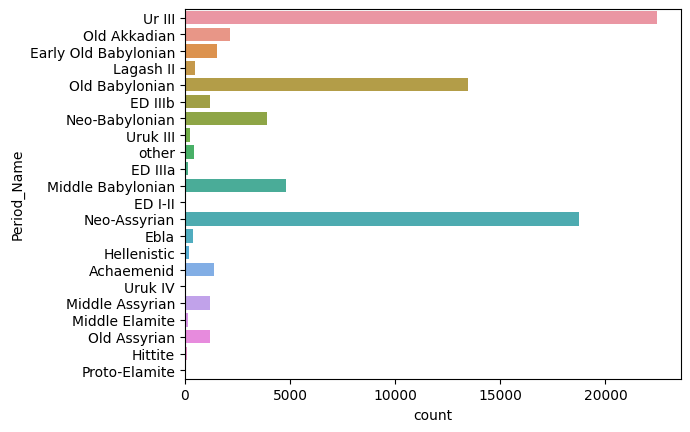

In [8]:
sns.countplot(y = df_encodings_train.Period_Name);

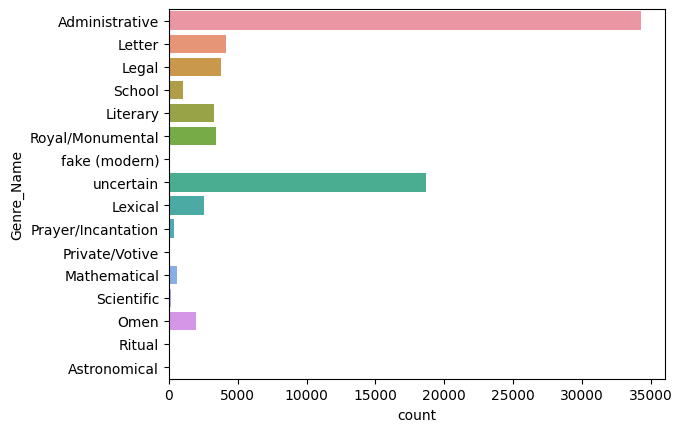

In [9]:
sns.countplot(y = df_encodings_train.Genre_Name);

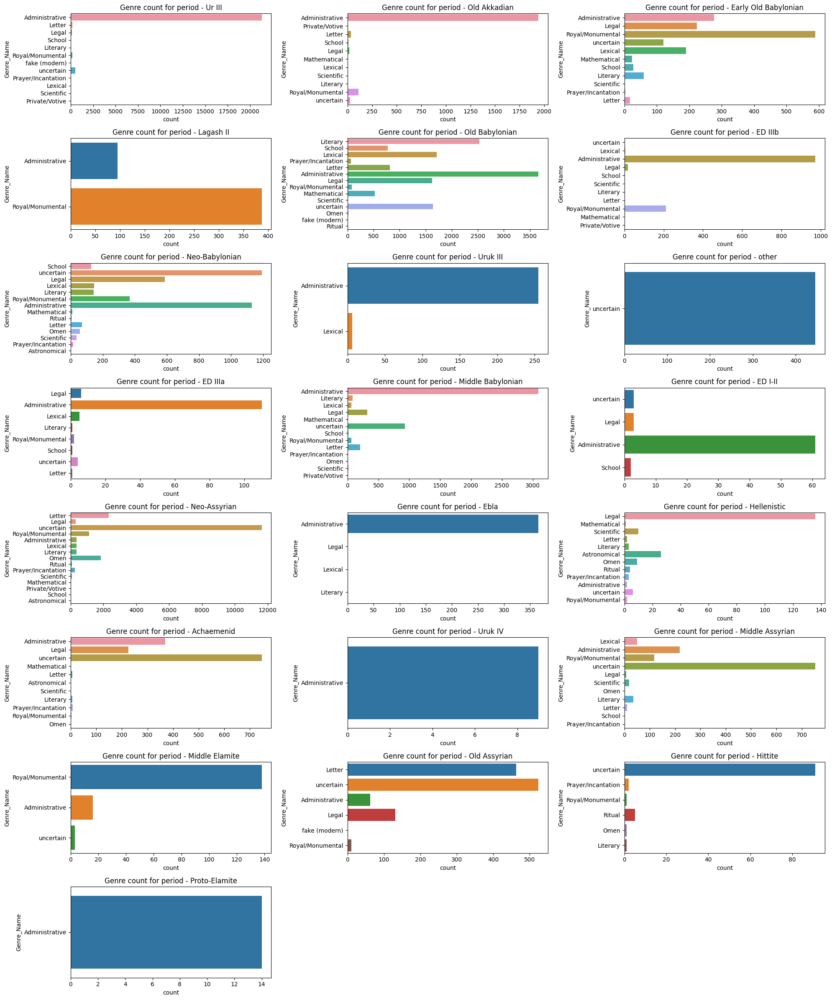

In [10]:
periods = df_encodings_train.Period_Name.unique()

n_rows = len(periods) // 3 + (1 if len(periods) % 3 else 0)

plt.figure(figsize=(20, n_rows * 3)) 

for i, period in enumerate(periods, start=1):
    plt.subplot(n_rows, 3, i)
    sns.countplot(y = df_encodings_train[df_encodings_train.Period_Name == period].Genre_Name)
    plt.title(f'Genre count for period - {period}')

plt.tight_layout()
plt.show()


# Classification based on Periods and genres (separately) 

This will enable us to assess the effectiveness of the VAE encodings as predictors for the genre/period classification tasks, even though the VAE wasn't initially trained for this purpose. It will indicate whether our research approach is on the right track and if tablet shapes correlate with their respective creation periods.

## Train-test division

In [11]:
y_train_period = df_encodings_train['Period']
X_train_period = df_encodings_train.drop(['Period', 'Genre', 'Period_Name','Genre_Name', 'CDLI_id'], axis = 1)

y_train_genre = df_encodings_train['Genre']
X_train_genre = df_encodings_train.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

y_val_period = df_encodings_val['Period']
X_val_period = df_encodings_val.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

y_val_genre = df_encodings_val['Genre']
X_val_genre = df_encodings_val.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

y_test_period = df_encodings_test['Period']
X_test_period = df_encodings_test.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

y_test_genre = df_encodings_test['Genre']
X_test_genre = df_encodings_test.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name', 'CDLI_id'], axis = 1)

In [15]:
df_encodings_val

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,Period,Genre,CDLI_id,Period_Name,Genre_Name
0,1.285394,0.663631,-0.526714,-2.845095,2.209945,-0.163361,0.132453,-1.590706,-0.309353,-0.460773,-0.441481,3.204756,1,1,100088,Ur III,Administrative
1,0.655061,-0.336266,1.183388,-1.684626,-0.008370,1.819560,-0.846972,-0.306408,-1.759361,-1.233201,-0.269435,3.307134,1,1,100090,Ur III,Administrative
2,0.198982,0.739984,-0.132881,-1.375820,1.804197,1.587954,-0.363059,-0.386454,0.011537,-0.527702,-0.743397,3.302871,1,1,100097,Ur III,Administrative
3,1.209759,1.523576,1.298837,-1.393650,0.848441,2.316830,-1.428441,-0.767547,-1.385526,-1.953019,-0.362048,3.526894,1,1,100109,Ur III,Administrative
4,0.274424,0.715886,-0.137083,-2.239995,2.688931,0.673372,-0.480786,-1.653987,0.050779,-0.200299,-0.926028,3.167606,1,1,100118,Ur III,Administrative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9274,0.405147,0.193642,-1.372014,-3.160770,3.221350,-0.257384,-0.517305,-2.443282,2.102776,1.062814,-0.214427,1.886673,3,1,492375,Old Babylonian,Administrative
9275,0.436327,0.701447,0.083765,-3.105410,2.436394,-0.022846,-0.082620,-0.940444,0.902494,-0.000996,-0.305479,3.296633,3,1,492381,Old Babylonian,Administrative
9276,1.317608,-0.072552,1.949150,-1.523231,1.047187,2.447377,-1.591436,0.628274,-1.351892,-2.679324,-0.629394,2.909834,1,1,492734,Ur III,Administrative
9277,1.092561,-1.939252,-1.151433,-0.702834,1.248361,1.508368,0.282948,-0.199629,-1.098899,0.401922,-1.506500,2.480135,1,1,492790,Ur III,Administrative


# KMeans

In [16]:
scaler = StandardScaler()
scaled_data_train = scaler.fit_transform(X_train_period)

In [17]:
wcss = []

for k in range(1, 22):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(scaled_data_train)
    wcss.append(kmeans.inertia_) 

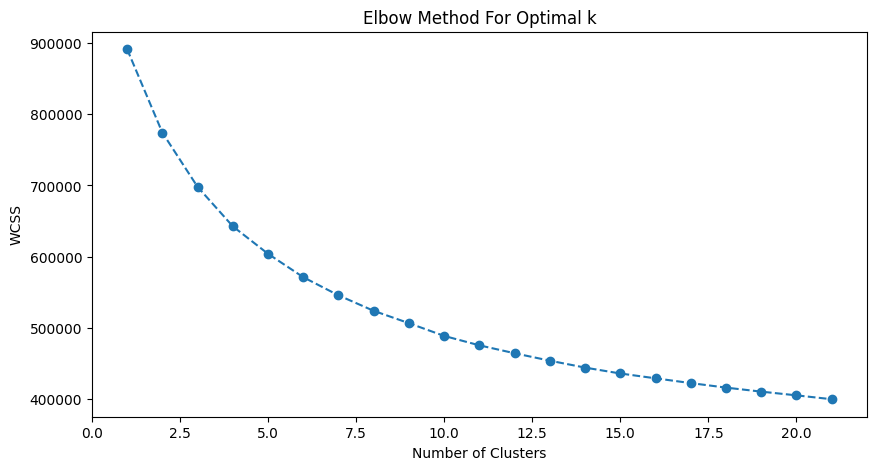

In [18]:
plt.figure(figsize=(10,5))
plt.plot(range(1, 22), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [19]:
kmeans_period = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y_period_kmeans = kmeans_period.fit_predict(scaled_data_train)

kmeans_df = df_encodings_train[['Genre_Name', 'Period_Name']].copy()
kmeans_df['kmeans_cluster'] = pred_y_period_kmeans
grouped_kmeans = kmeans_df.groupby(['kmeans_cluster', 'Period_Name']).size().reset_index(name='count')

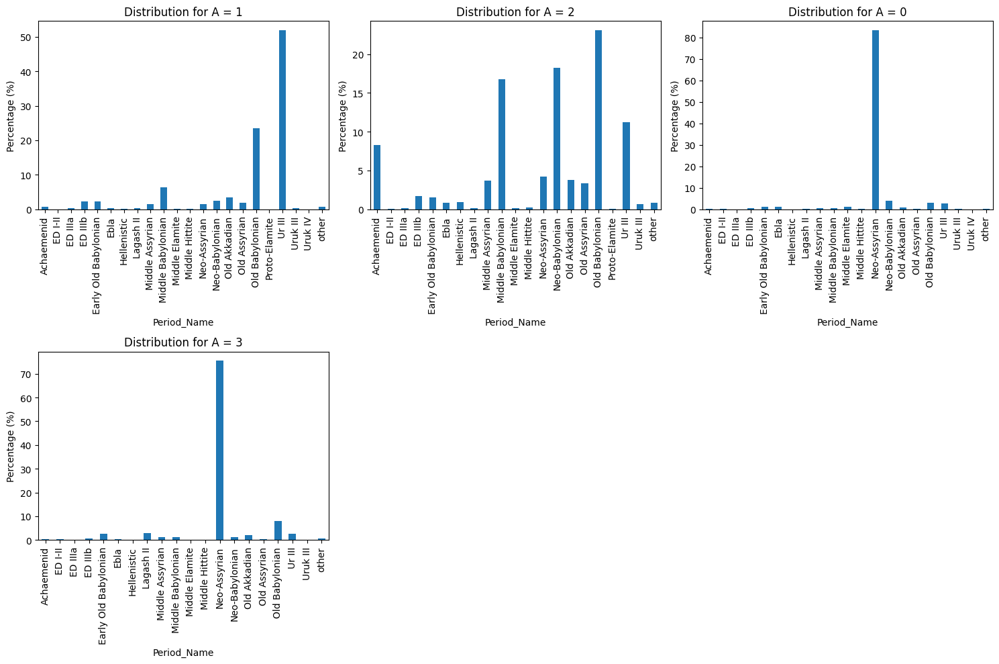

In [20]:
unique_values_A = kmeans_df['kmeans_cluster'].unique()

n_rows = int(np.ceil(len(unique_values_A) / 3.0))
fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5 * n_rows))

if axes.ndim == 1:
    axes = axes.reshape(-1, 3)

for idx, value in enumerate(unique_values_A):
    row, col = divmod(idx, 3)
    ax = axes[row, col]
    subset = grouped_kmeans[grouped_kmeans['kmeans_cluster'] == value].copy()
    total = subset['count'].sum()
    subset['percentage'] = (subset['count'] / total) * 100
    subset.plot(x='Period_Name', y='percentage', kind='bar', ax=ax, legend=False)
    ax.set_title(f'Distribution for A = {value}')
    ax.set_ylabel('Percentage (%)')

for idx in range(len(unique_values_A), n_rows * 3):
    row, col = divmod(idx, 3)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [21]:
grouped_kmeans_genre = kmeans_df.groupby(['kmeans_cluster', 'Genre_Name']).size().reset_index(name='count')

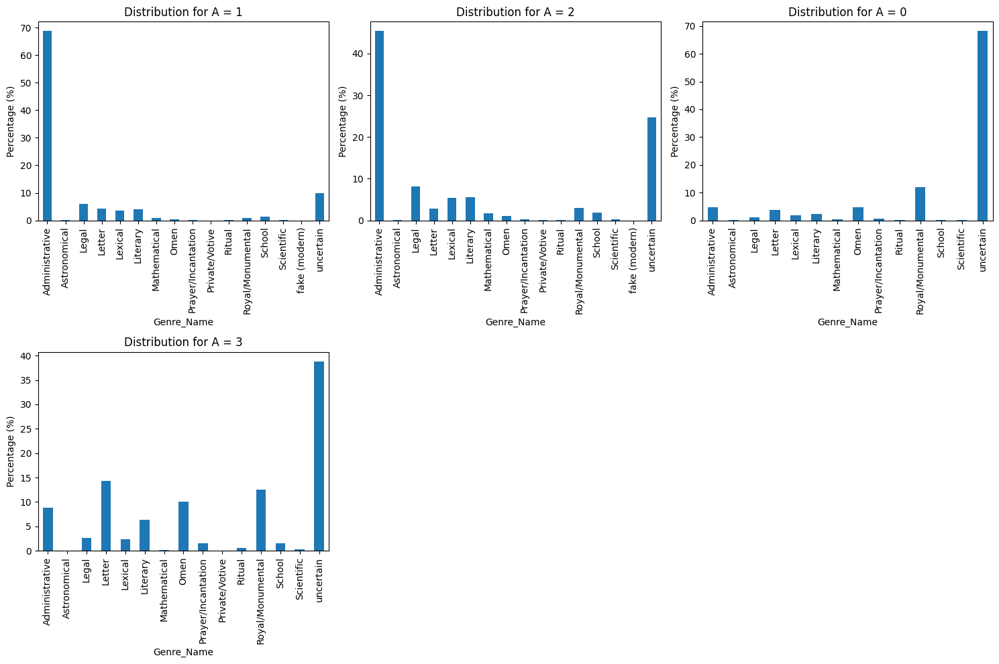

In [22]:
unique_values_A = kmeans_df['kmeans_cluster'].unique()

n_rows = int(np.ceil(len(unique_values_A) / 3.0))
fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5 * n_rows))

if axes.ndim == 1:
    axes = axes.reshape(-1, 3)

for idx, value in enumerate(unique_values_A):
    row, col = divmod(idx, 3)
    ax = axes[row, col]
    subset = grouped_kmeans_genre[grouped_kmeans_genre['kmeans_cluster'] == value].copy()
    total = subset['count'].sum()
    subset['percentage'] = (subset['count'] / total) * 100
    subset.plot(x='Genre_Name', y='percentage', kind='bar', ax=ax, legend=False)
    ax.set_title(f'Distribution for A = {value}')
    ax.set_ylabel('Percentage (%)')

# Hide any unused subplots
for idx in range(len(unique_values_A), n_rows * 3):
    row, col = divmod(idx, 3)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

We can see that nothing is quite distinguishable besides: Neo Assyrian, Ur III and Old Babylonian, and also Administrative and uncertain genres, basically the largest classes of each type.

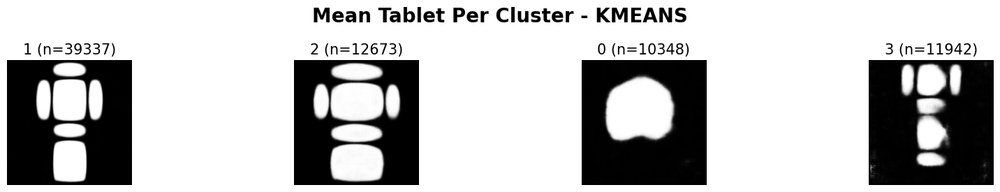

In [23]:
kmeans_analysis_df = X_train_period.copy()
kmeans_analysis_df['kmeans_cluster'] = kmeans_df['kmeans_cluster']
mean_enc_df = generate_mean_tablet_plot(kmeans_analysis_df, column_name='kmeans_cluster', model=vae_model, grid_title="Mean Tablet Per Cluster - KMEANS")

# Period classifier
### Training a model based on the encoding

In [24]:
num_classes_period = len(TabletPeriodDataset.PERIOD_INDICES) 

In [25]:
D_train_period = xgb.DMatrix(X_train_period, label=y_train_period)
D_test_period = xgb.DMatrix(X_test_period, label=y_test_period)

In [23]:
# cv_results = []
# nfold = 5
# early_stopping_rounds = 10
# param_grid = {
#     'eta': [0.05, 0.1, 0.3],  
#     'max_depth': [6, 12, 18], 
#     'subsample': [0.8, 0.9, 1.0],  
#     'colsample_bytree': [0.8, 0.9, 1.0]
# }
    
# param_combinations = list(product(param_grid['eta'], param_grid['max_depth'], 
#                                   param_grid['subsample'], param_grid['colsample_bytree']))

# for eta, max_depth, subsample, colsample_bytree in tqdm(param_combinations, desc="Tuning"):
#     param = {
#         'eta': eta,
#         'max_depth': max_depth,
#         'subsample': subsample,
#         'colsample_bytree': colsample_bytree,
#         'objective': 'multi:softprob',
#         'num_class': num_classes_period,
#         'nthread': 4
#     }
    
#     cv_result = xgb.cv(param, D_train_period, num_boost_round=50, nfold=nfold,
#                        metrics={'mlogloss'}, early_stopping_rounds=early_stopping_rounds, as_pandas=True)
    
#     cv_results.append({
#         'params': param,
#         'mean_mlogloss': cv_result['test-mlogloss-mean'].min(),
#         'boost_rounds': cv_result['test-mlogloss-mean'].idxmin()
#     })

# best_cv_result = min(cv_results, key=lambda x: x['mean_mlogloss'])
# print("Best Parameters:", best_cv_result['params'])
# print("Best Mean MLogLoss:", best_cv_result['mean_mlogloss'])
# print("Boost Rounds:", best_cv_result['boost_rounds'])

### Prediction 

In [26]:
best_parameters = {'eta': 0.1, 'max_depth': 12, 'subsample': 0.9, 'colsample_bytree': 0.9, 'objective': 'multi:softprob', 'num_class': 22, 'nthread': 10} # just so i remember
num_boost_round = 49
final_model = xgb.train(best_parameters, D_train_period, num_boost_round=num_boost_round)
best_preds_period = [int(p.argmax()) for p in final_model.predict(D_test_period)]

#### Adding Eras to the prediction labels

In [27]:
def explain(period):
    return f'{period} ({ERA_MAP.get(period, "?")})'

In [28]:
EARLY_BRONZE = {
    'Old Akkadian', 'Ur III',
    'ED IIIb', 'Uruk III',
    'Proto-Elamite', 'Lagash II',
    'Ebla', 'ED IIIa', 'ED I-II',
    'Uruk IV', 'Linear Elamite',
    'Harappan'
    
}
MID_LATE_BRONZE = {
    'Early Old Babylonian',
    'Old Babylonian', 'Old Assyrian',
    'Middle Babylonian', 'Middle Assyrian',
    'Middle Elamite', 'Hittite'
}
IRON = {
    'Neo-Babylonian', 'Neo-Assyrian',
    'Achaemenid', 'Hellenistic',
    'Neo-Elamite'
}
ERA_MAP = {
    **{K: 'EB' for K in EARLY_BRONZE},
    **{K: 'MLB' for K in MID_LATE_BRONZE},
    **{K: 'I' for K in IRON},
}

In [29]:
idx2period = {v: k for k, v in TabletPeriodDataset.PERIOD_INDICES.items()}
idx2period[0] = 'other'

In [30]:
indices_period = list(set(y_test_period) | set(best_preds_period))
PERIOD_LABELS = [explain(idx2period[i]) for i in indices_period]

In [31]:
print(classification_report(y_test_period, best_preds_period, zero_division=0, target_names=PERIOD_LABELS))

                            precision    recall  f1-score   support

                 other (?)       1.00      0.02      0.04        49
               Ur III (EB)       0.73      0.87      0.79      2799
          Neo-Assyrian (I)       0.90      0.95      0.92      2304
      Old Babylonian (MLB)       0.47      0.64      0.54      1671
   Middle Babylonian (MLB)       0.41      0.26      0.32       602
        Neo-Babylonian (I)       0.52      0.38      0.44       502
         Old Akkadian (EB)       0.73      0.21      0.33       304
            Achaemenid (I)       0.73      0.29      0.42       200
Early Old Babylonian (MLB)       0.66      0.24      0.36       205
              ED IIIb (EB)       0.70      0.37      0.48       154
     Middle Assyrian (MLB)       0.52      0.09      0.16       149
        Old Assyrian (MLB)       0.66      0.25      0.36       147
             Uruk III (EB)       0.57      0.17      0.27        23
        Proto-Elamite (EB)       0.00      0.00

#### Repeating the analysis using classes with support >=10, everything else goes to 0: other

In [32]:
COMMON_LABELS_PERIOD = list({k for k, v in Counter(y_test_period).items() if v >= 40})
print(f'Common period labels: ({len(COMMON_LABELS_PERIOD)})')

Common period labels: (14)


In [33]:
y_true_period_c = y_test_period.copy()
y_true_period_c[~np.isin(y_test_period, COMMON_LABELS_PERIOD)] = 0
print(round((~np.isin(y_test_period, COMMON_LABELS_PERIOD)).mean(), 2), 'changed to "other"')

0.01 changed to "other"


In [34]:
preds_period_c = np.array(best_preds_period.copy())
preds_period_c[~np.isin(best_preds_period, COMMON_LABELS_PERIOD)] = 0
print(round((~np.isin(best_preds_period, COMMON_LABELS_PERIOD)).mean(), 2), 'changed to "other"')

0.0 changed to "other"


In [35]:
indices_period_c = list(set(y_true_period_c) | set(preds_period_c))
PERIOD_LABELS_C = [explain(idx2period[i]) for i in indices_period_c]

In [36]:
print(classification_report(y_true_period_c, preds_period_c, target_names=PERIOD_LABELS_C))

                            precision    recall  f1-score   support

                 other (?)       0.78      0.09      0.17       148
               Ur III (EB)       0.73      0.87      0.79      2799
          Neo-Assyrian (I)       0.90      0.95      0.92      2304
      Old Babylonian (MLB)       0.47      0.64      0.54      1671
   Middle Babylonian (MLB)       0.41      0.26      0.32       602
        Neo-Babylonian (I)       0.52      0.38      0.44       502
         Old Akkadian (EB)       0.73      0.21      0.33       304
            Achaemenid (I)       0.73      0.29      0.42       200
Early Old Babylonian (MLB)       0.66      0.24      0.36       205
              ED IIIb (EB)       0.70      0.37      0.48       154
     Middle Assyrian (MLB)       0.52      0.09      0.16       149
        Old Assyrian (MLB)       0.66      0.25      0.36       147
            Lagash II (EB)       0.64      0.50      0.56        64
                 Ebla (EB)       0.50      0.15

In [37]:
y_prob = final_model.predict(D_test_period)

# Binarize the labels for AUC calculation
Y = label_binarize(y_test_period, classes=np.unique(y_test_period))
n_classes = Y.shape[1]

# Calculate AUC scores for each class and store them
auc_scores = []
for i in range(n_classes):
    auc = roc_auc_score(Y[:, i], y_prob[:, i])
    auc_scores.append(auc)

# Calculate the Macro-OvR AUC
macro_ovr_auc = np.mean(auc_scores)
print(f"Macro-OvR-AUC: {macro_ovr_auc}")

Macro-OvR-AUC: 0.883477478817613


In [38]:
cm_period = confusion_matrix(y_true_period_c, preds_period_c)
cm_period_rownorm = (cm_period / cm_period.sum(axis=1)[:, None])

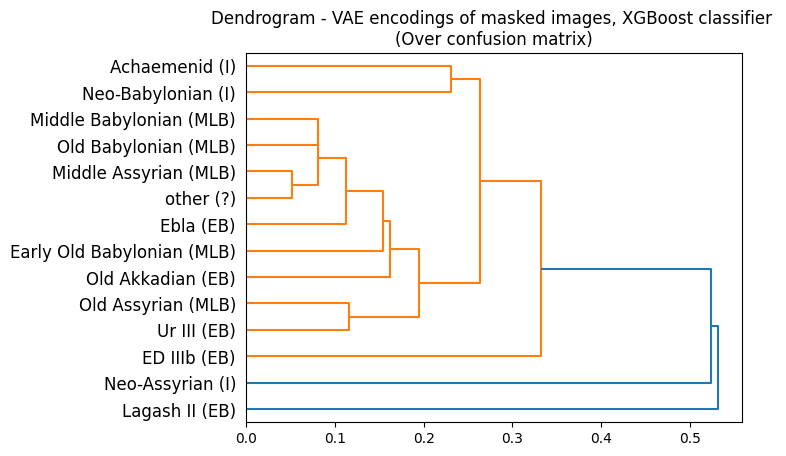

In [39]:
Y = hierarchy.distance.pdist(cm_period_rownorm, metric='cosine')
Z = hierarchy.linkage(Y, method='single')
ax = hierarchy.dendrogram(Z, show_contracted=True, labels=PERIOD_LABELS_C, orientation='right')
plt.title("Dendrogram - VAE encodings of masked images, XGBoost classifier \n(Over confusion matrix)");

In [40]:
cm = confusion_matrix(y_true_period_c, preds_period_c)

In [41]:
cm_rownorm = (cm / cm.sum(axis=1)[:, None])

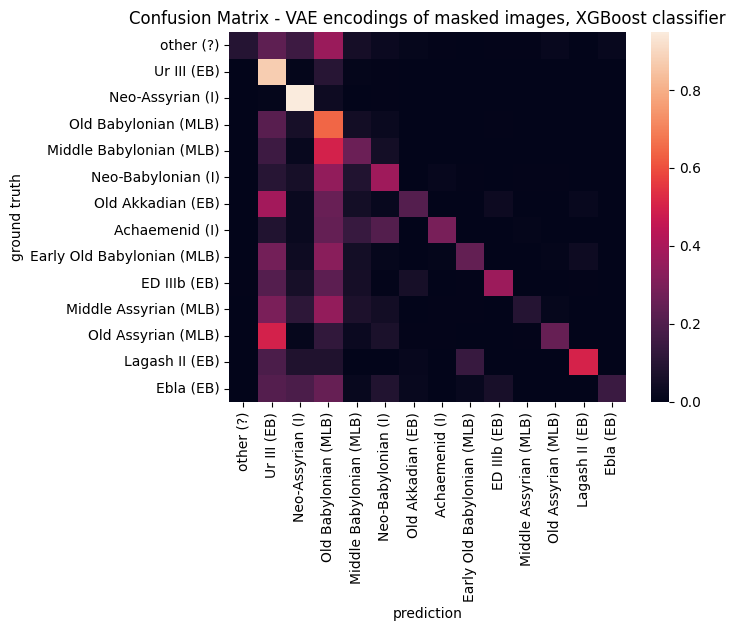

In [42]:
sns.heatmap(cm_rownorm, xticklabels=PERIOD_LABELS_C, yticklabels=PERIOD_LABELS_C);
plt.xlabel('prediction');
plt.ylabel('ground truth')
plt.title("Confusion Matrix - VAE encodings of masked images, XGBoost classifier");

## Genre classifier
### Training a model based on the encoding

In [43]:
import xgboost as xgb

num_classes_genre = len(set(TabletPeriodDataset.GENRE_INDICES.values()))+2

D_train_genre = xgb.DMatrix(X_train_genre, label=y_train_genre)
D_test_genre = xgb.DMatrix(X_test_genre, label=y_test_genre)

# Define XGBoost parameters
param = {
    'eta': 0.05, 
    'max_depth': 10,  
    'objective': 'multi:softprob',  
    'num_class': num_classes_genre 
} 
steps = 50  # The number of training iterations

# Train the model
model_genre = xgb.train(param, D_train_genre, steps)

### Prediction

In [44]:
# Predict Output
best_preds_genre = [int(p.argmax()) for p in model_genre.predict(D_test_genre)]

In [45]:
GENRE_INDICES = {
        
        1: 'Administrative',
        2: 'Letter',
        3: 'Legal',
        4: 'Royal/Monumental',
        5: 'Literary',
        6: 'Lexical',
        7: 'Omen',
        8: 'uncertain',
        9: 'School',
        10: 'Mathematical',
        11: 'Prayer/Incantation',
        12: 'Scientific',
        13: 'Ritual',
        14: 'fake (modern)',
        15: 'Astronomical',
        16: 'Private/Votive',
    }

In [46]:
indices_genre = list(set(y_test_genre) | set(best_preds_genre))
GENRE_LABELS = [GENRE_INDICES[i] for i in indices_genre]

In [47]:
print(classification_report(y_test_genre, best_preds_genre, target_names=GENRE_LABELS, zero_division=False))

                    precision    recall  f1-score   support

    Administrative       0.67      0.94      0.78      4361
            Letter       0.59      0.23      0.33       533
             Legal       0.33      0.06      0.09       453
  Royal/Monumental       0.72      0.54      0.62       416
          Literary       0.38      0.09      0.14       437
           Lexical       0.14      0.02      0.03       312
              Omen       0.50      0.10      0.17       239
         uncertain       0.61      0.65      0.63      2250
            School       0.80      0.12      0.20       139
      Mathematical       0.25      0.01      0.03        76
Prayer/Incantation       0.00      0.00      0.00        45
        Scientific       0.00      0.00      0.00        23
            Ritual       0.00      0.00      0.00        10
     fake (modern)       0.00      0.00      0.00         1
      Astronomical       0.00      0.00      0.00         2

          accuracy                    

### Repeating the analysis using classes with support >=10, everything else goes to 8: uncertain

In [48]:
COMMON_LABELS_GENRE = list({k for k, v in Counter(y_test_genre).items() if v >= 50})
print(f'Common period labels: ({len(COMMON_LABELS_GENRE)})')

Common period labels: (10)


In [49]:
y_pred_genre_c = np.array(best_preds_genre.copy())
y_pred_genre_c[~np.isin(best_preds_genre, COMMON_LABELS_GENRE)] = 8
print(round((~np.isin(best_preds_genre, COMMON_LABELS_GENRE)).mean(), 3), 'changed to "uncertain"')

0.0 changed to "uncertain"


In [50]:
y_true_genre_c = y_test_genre.copy()
y_true_genre_c[~np.isin(y_test_genre, COMMON_LABELS_GENRE)] = 8
print(round((~np.isin(y_test_genre, COMMON_LABELS_GENRE)).mean(), 3), 'changed to "uncertain"')

0.009 changed to "uncertain"


In [51]:
indices_genre_c = list(set(y_true_genre_c) | set(y_pred_genre_c))
GENRE_LABELS_C = [GENRE_INDICES[i] for i in indices_genre_c]

In [52]:
print(classification_report(y_true_genre_c.values, y_pred_genre_c, target_names=GENRE_LABELS_C))

                  precision    recall  f1-score   support

  Administrative       0.67      0.94      0.78      4361
          Letter       0.59      0.23      0.33       533
           Legal       0.33      0.06      0.09       453
Royal/Monumental       0.72      0.54      0.62       416
        Literary       0.38      0.09      0.14       437
         Lexical       0.14      0.02      0.03       312
            Omen       0.50      0.10      0.17       239
       uncertain       0.63      0.65      0.64      2331
          School       0.80      0.12      0.20       139
    Mathematical       0.25      0.01      0.03        76

        accuracy                           0.65      9297
       macro avg       0.50      0.27      0.30      9297
    weighted avg       0.60      0.65      0.59      9297



# Analysis - Per class mean

This analysis allows us to examine the average representation of tablets within each class (period/genre) and delve into the distinctions within each genre/period. This will shed light on whether the VAE model successfully identified shapes in a manner that differentiates between the various classes, without it being trained on a supervised task.

## Mean tablet representation, per genre:

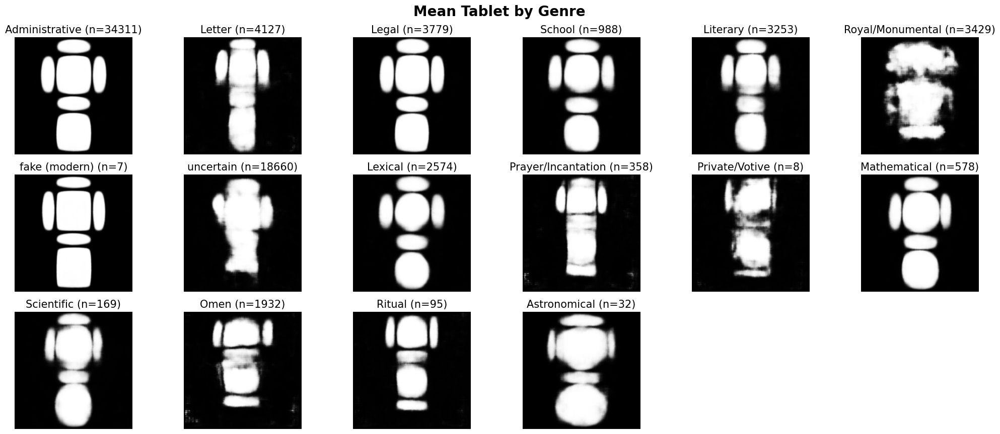

In [12]:
mean_tablet_genre = generate_mean_tablet_plot(df_encodings_train.drop(['Period', 'Genre', 'Period_Name', 'CDLI_id'], axis=1), 
                                              column_name='Genre_Name', model=vae_model, grid_title="Mean Tablet by Genre")

## Mean tablet representation, per period:

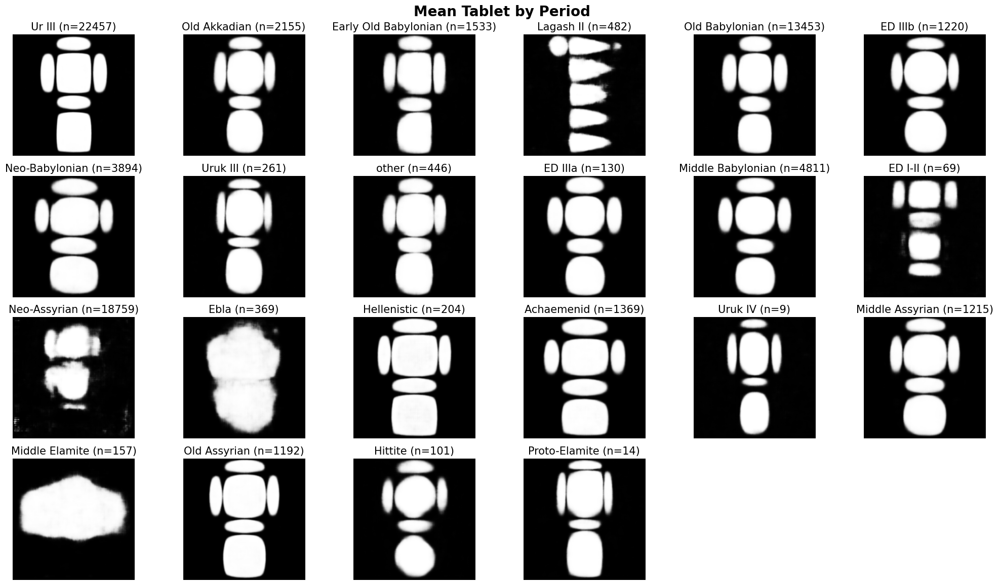

In [13]:
mean_tablet_period = generate_mean_tablet_plot(df_encodings_train.drop(['Period', 'Genre', 'Genre_Name', 'CDLI_id'], axis=1), 
                                              column_name='Period_Name', model=vae_model, grid_title="Mean Tablet by Period")

## Mean tablet representation, per period, per genre:

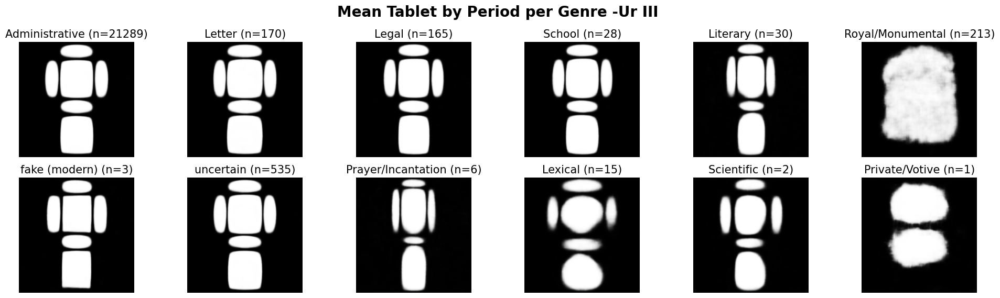

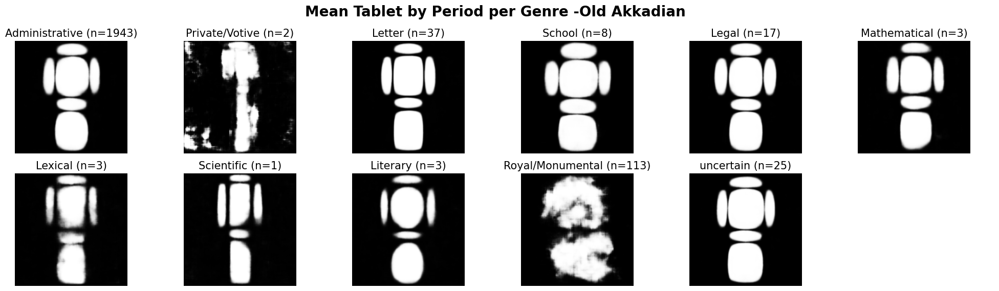

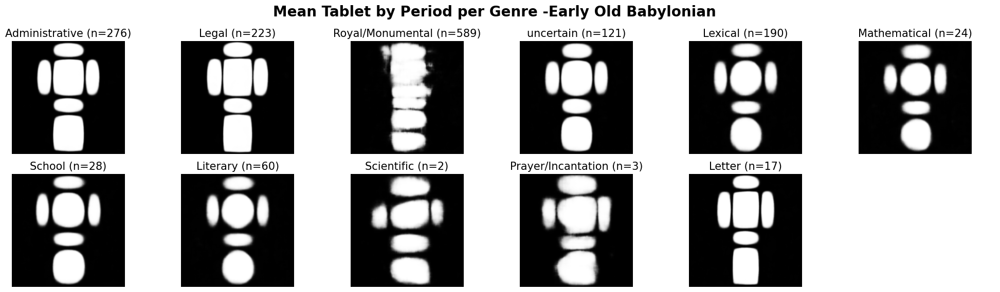

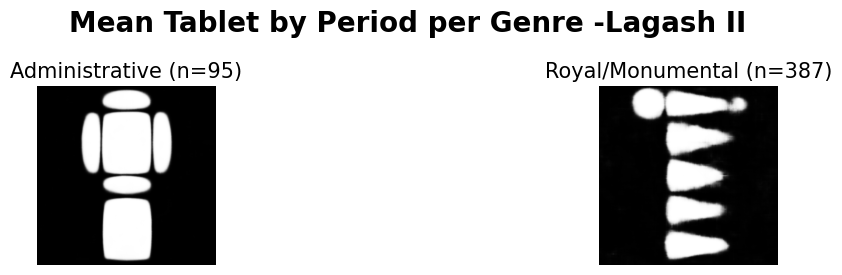

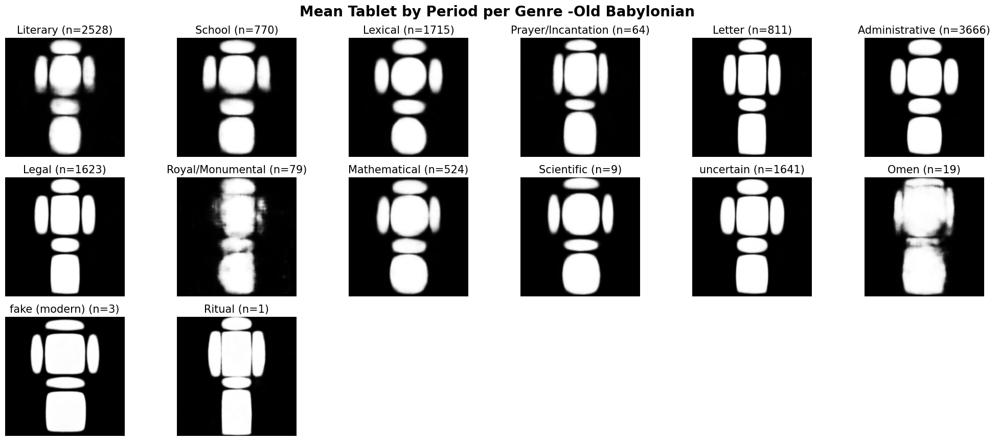

...

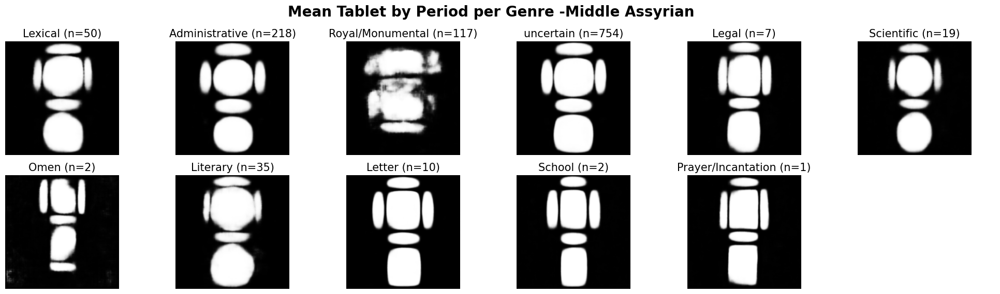

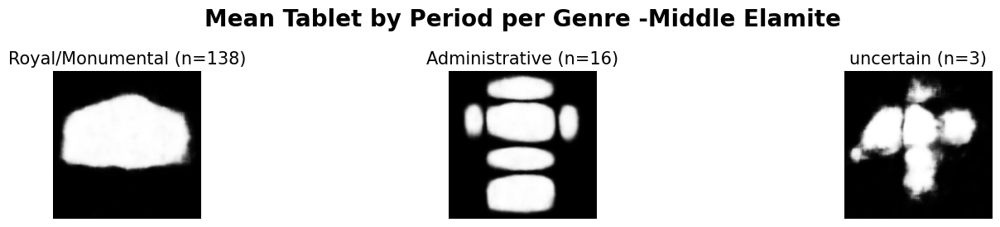

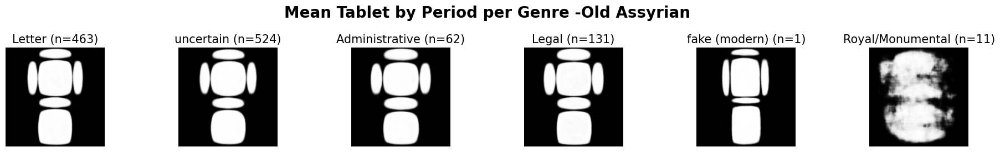

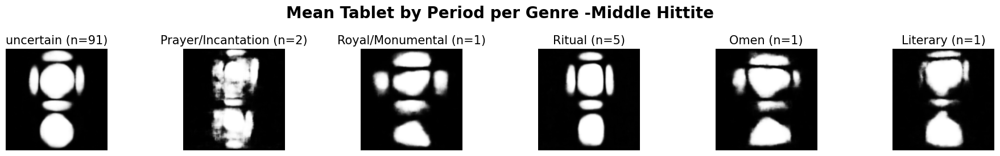

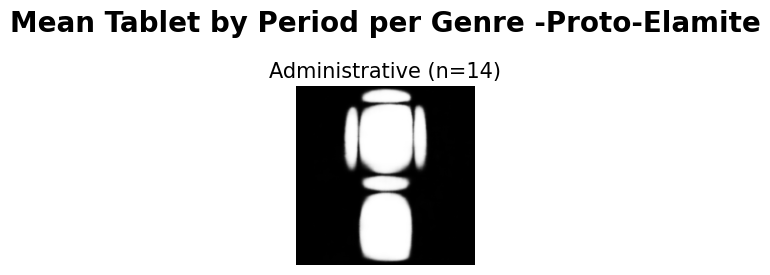

In [55]:
for period in df_encodings_train['Period_Name'].unique():
    generate_mean_tablet_plot(df_encodings_train[df_encodings_train['Period_Name']==period].drop(['Period', 'Genre', 'Period_Name', 'CDLI_id'], axis=1), 
                                              column_name='Genre_Name', model=vae_model, grid_title="Mean Tablet by Period per Genre -"+period)    

# LDA analysis of the encodings

By this analysis, we can see how the encodings cluster, and try to explain the meaning of the cluster division. We could also see how predictive these clusters are of the classes (periods / genres)

### Period LDA

In [56]:
lda_period = LinearDiscriminantAnalysis()
components_period = lda_period.fit_transform(X_train_period, y_train_period)

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
from ipywidgets import VBox, Output
from IPython.display import display

# Assuming components_period and df_encodings_train are defined as per your initial code snippet

# Define the output widget for the plot
plot_output = Output()

# Define the plotting function
def plot_with_labels(selected_labels):
    with plot_output:
        plot_output.clear_output(wait=True)  # Clear the previous plot
        # Filter data based on selected labels
        filtered_df = df_encodings_train[df_encodings_train['Period_Name'].isin(selected_labels)]
        plt.figure(figsize=(10, 10))
        sns.scatterplot(
            x=components_period[filtered_df.index, 0],
            y=components_period[filtered_df.index, 1],
            hue=filtered_df['Period_Name'],
            palette='colorblind'
        )
        plt.xlabel('LDA Dimension 1')
        plt.ylabel('LDA Dimension 2')
        plt.title('Embedded Space per period - LDA')
        plt.legend()
        plt.show()

# Create a widget for label selection
label_options = df_encodings_train['Period_Name'].unique()
label_selector = widgets.SelectMultiple(
    options=label_options,
    value=[label_options[0]],  # Default value
    description='Labels',
    disabled=False
)

# Function to update the plot based on selection
def on_selection_change(change):
    plot_with_labels(list(label_selector.value))

# Attach the update function to the selection widget for value changes
label_selector.observe(on_selection_change, names='value')

# Display the widget and the initial plot in its output area
display(label_selector, plot_output)
# Initially display the plot
plot_with_labels(list(label_selector.value))


SelectMultiple(description='Labels', index=(0,), options=('Ur III', 'Old Akkadian', 'Early Old Babylonian', 'L…

Output()

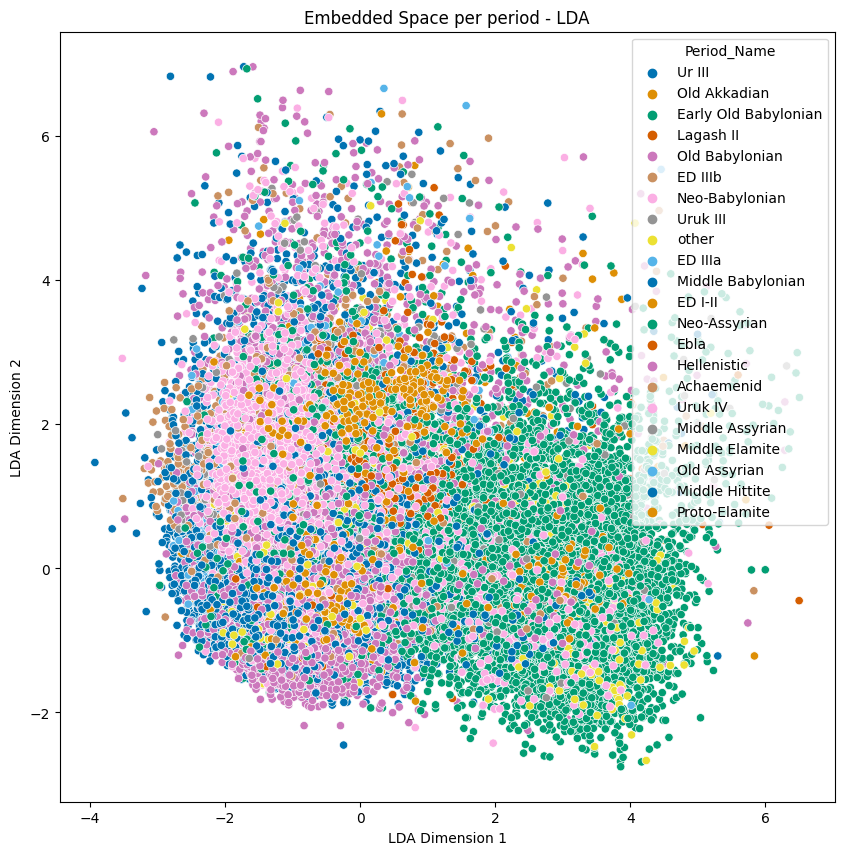

In [58]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=components_period[:, 0], y=components_period[:, 1], hue=df_encodings_train['Period_Name'], palette='colorblind')
plt.xlabel('LDA Dimension 1')
plt.ylabel('LDA Dimension 2')
plt.title('Embedded Space per period - LDA')
plt.show()

In [59]:
lda_preds_period = lda_period.predict(X_test_period)
lda_X_test_period = X_test_period.copy()
lda_X_test_period['lda_preds'] = lda_preds_period

### Let's look at the main shapes in each cluster:

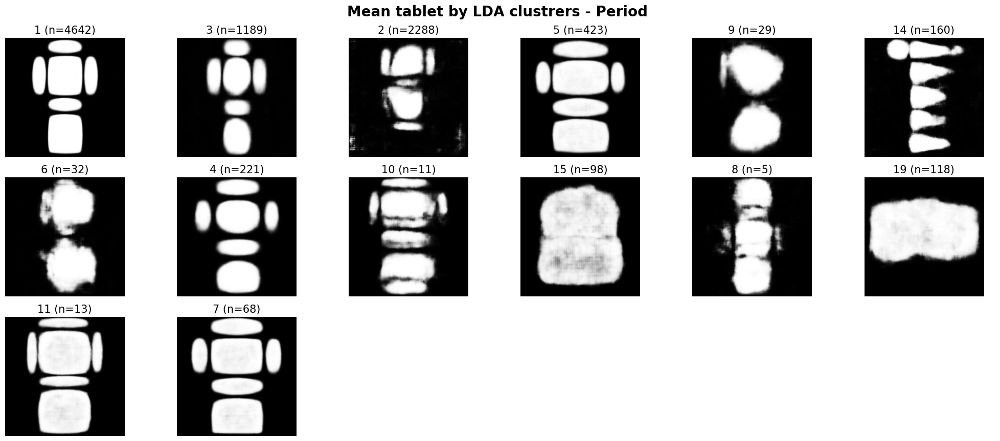

In [60]:
period_lda_clusters_mean = generate_mean_tablet_plot(lda_X_test_period, column_name='lda_preds', model=vae_model, grid_title='Mean tablet by LDA clustrers - Period')

In [61]:
lda_X_test_period['Period'] = y_test_period

### Genre LDA

In [62]:
lda_genre = LinearDiscriminantAnalysis()
components_genre = lda_genre.fit_transform(X_train_genre, y_train_genre)

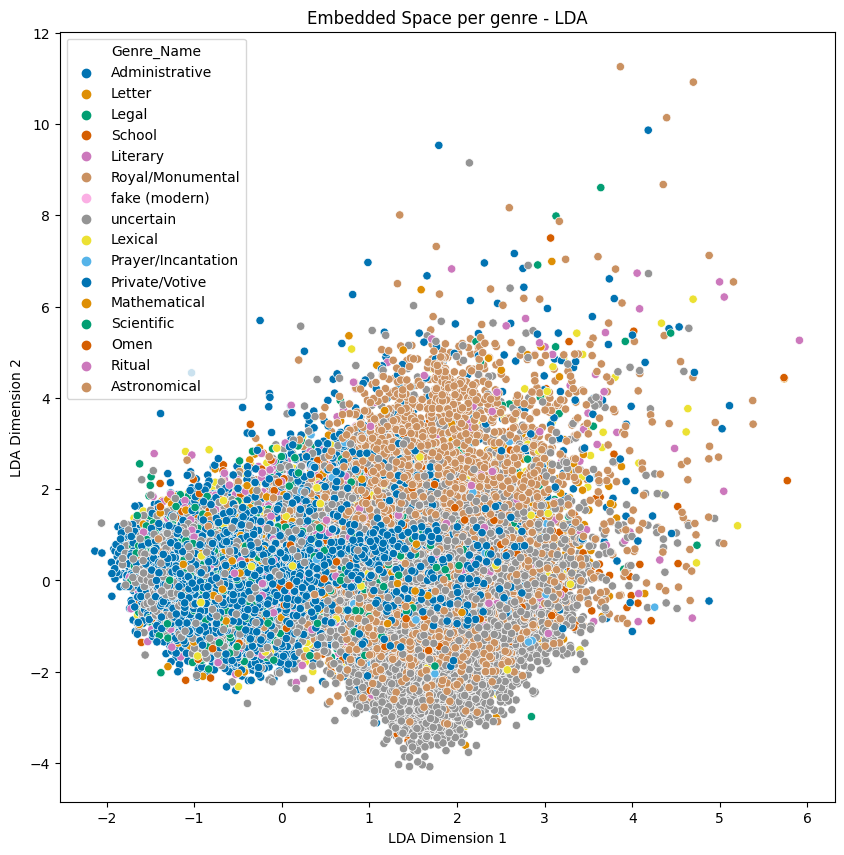

In [63]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=components_genre[:, 0], y=components_genre[:, 1], hue=df_encodings_train['Genre_Name'], palette='colorblind')
plt.xlabel('LDA Dimension 1')
plt.ylabel('LDA Dimension 2')
plt.title('Embedded Space per genre - LDA')
plt.show()

In [64]:
lda_preds_genre = lda_genre.predict(X_train_genre)
lda_X_train_genre = X_train_genre.copy()
lda_X_train_genre['lda_preds_genre'] = lda_preds_genre

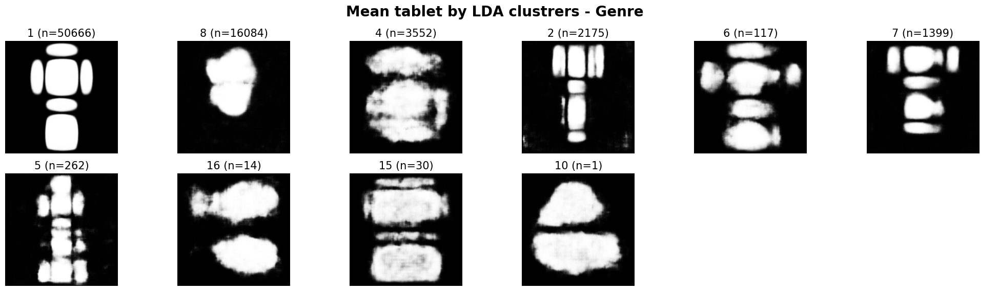

In [65]:
genre_lda_clusters_mean = generate_mean_tablet_plot(lda_X_train_genre, column_name='lda_preds_genre', model=vae_model, grid_title='Mean tablet by LDA clustrers - Genre')

# TSNE Clustering

In [66]:
from sklearn.manifold import TSNE

%time F = TSNE(n_components=2, init='pca').fit_transform(X_train_period)

CPU times: user 17min 35s, sys: 59 s, total: 18min 34s
Wall time: 5min 22s


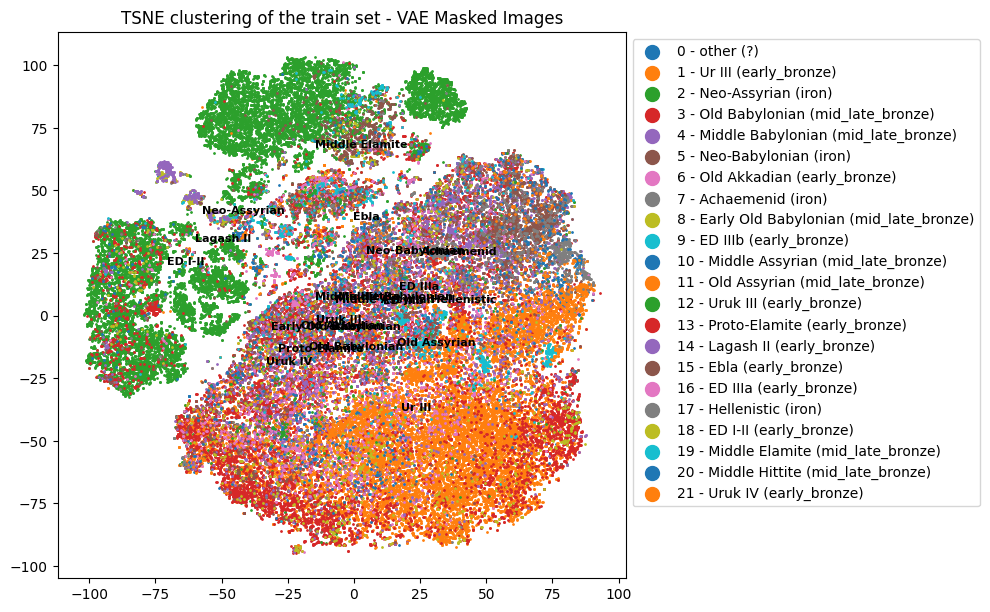

In [78]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)

for period in set(y_train_period):
    period_data = F[y_train_period == period]
    
    # Scatter plot for the period.
    ax.scatter(period_data[:, 0], period_data[:, 1], label=f'{period} - {explain(idx2period[period])}', s=1)
    
    centroid = np.mean(period_data, axis=0)
    
    ax.text(centroid[0], centroid[1], f'{idx2period[period]}', horizontalalignment='center', verticalalignment='center', fontsize=8, weight='bold')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), markerscale=10)
plt.tight_layout()
plt.title('TSNE clustering of the train set - VAE Masked Images')
scatter_pdf_path = 'output/plots/TSNEclusteringGreyscale.pdf'
plt.savefig(scatter_pdf_path, format='pdf')

#plt.show()

In [70]:
EARLY_BRONZE = {
    'Old Akkadian', 'Ur III',
    'ED IIIb', 'Uruk III',
    'Proto-Elamite', 'Lagash II',
    'Ebla', 'ED IIIa', 'ED I-II',
    'Uruk IV', 'Linear Elamite',
    'Harappan'
    
}
MID_LATE_BRONZE = {
    'Early Old Babylonian',
    'Old Babylonian', 'Old Assyrian',
    'Middle Babylonian', 'Middle Assyrian',
    'Middle Elamite', 'Hittite'
}
IRON = {
    'Neo-Babylonian', 'Neo-Assyrian',
    'Achaemenid', 'Hellenistic',
    'Neo-Elamite'
}

In [71]:
ERA_MAP = {
    **{K: 'early_bronze' for K in EARLY_BRONZE},
    **{K: 'mid_late_bronze' for K in MID_LATE_BRONZE},
    **{K: 'iron' for K in IRON},
}

In [75]:
len(df_encodings_train['era'])

74300

In [73]:
df_encodings_train['era'] = df_encodings_train.Period_Name.map(ERA_MAP)

/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


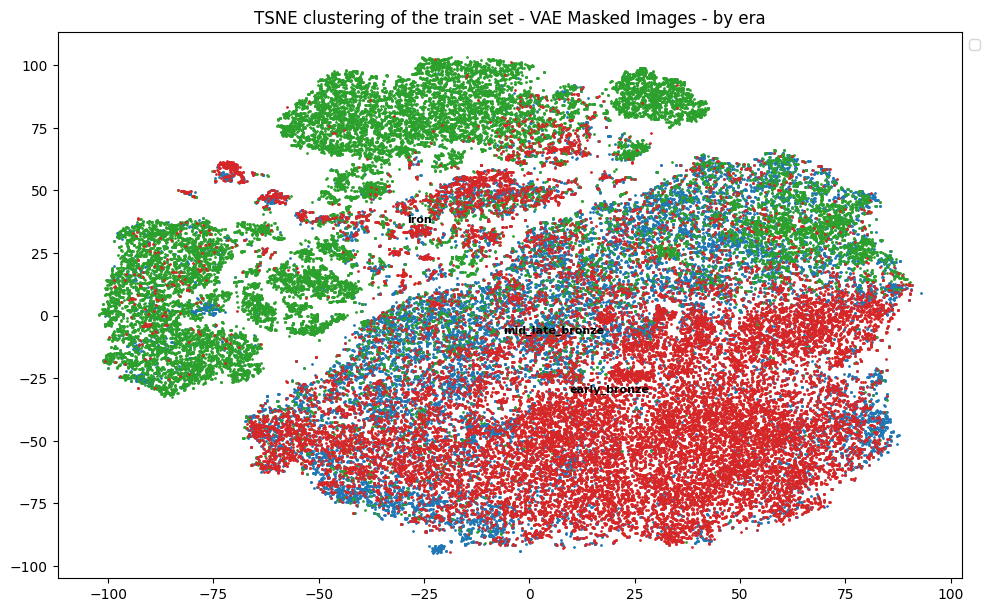

In [84]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)

for era in set(df_encodings_train['era']):
    era_data = F[df_encodings_train['era'] == era]
    
    # Scatter plot for the period.
    ax.scatter(era_data[:, 0], era_data[:, 1], s=1)
    
    centroid = np.mean(era_data, axis=0)
    
    ax.text(centroid[0], centroid[1], era, horizontalalignment='center', verticalalignment='center', fontsize=8, weight='bold')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), markerscale=10)
plt.tight_layout()
plt.title('TSNE clustering of the train set - VAE Masked Images - by era')
plt.savefig(scatter_pdf_path, format='pdf')

#plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


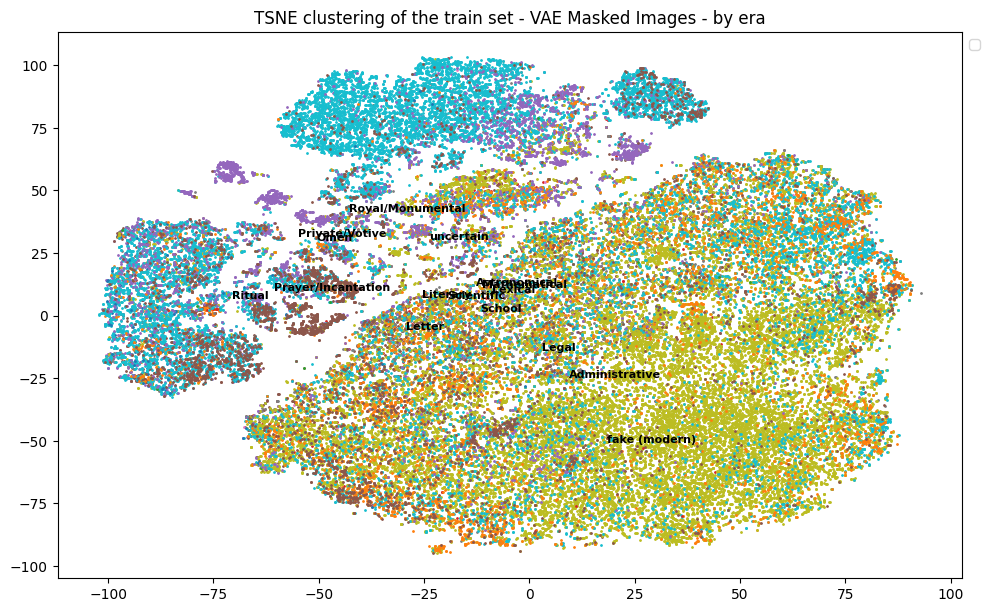

In [83]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)

for genre in set(df_encodings_train['Genre_Name']):
    genre_data = F[df_encodings_train['Genre_Name'] == genre]
    
    # Scatter plot for the period.
    ax.scatter(genre_data[:, 0], genre_data[:, 1], s=1)
    
    centroid = np.mean(genre_data, axis=0)
    
    ax.text(centroid[0], centroid[1], genre, horizontalalignment='center', verticalalignment='center', fontsize=8, weight='bold')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), markerscale=10)
plt.tight_layout()
plt.title('TSNE clustering of the train set - VAE Masked Images - by era')
plt.savefig(scatter_pdf_path, format='pdf')

#plt.show()